In [1]:
import numpy as np
import math
import cv2
import copy
import sys
from matplotlib import pyplot as plt
import numpy.linalg as la
import sklearn
from sklearn.ensemble import IsolationForest


EPS = 0.01;
TH = 150 * math.sqrt(2)

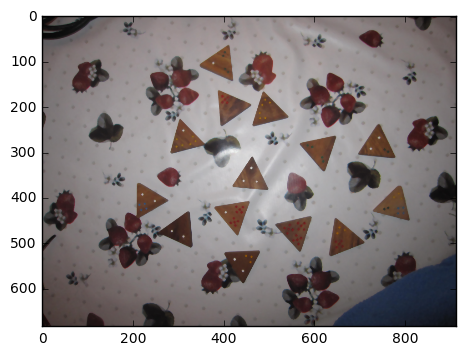

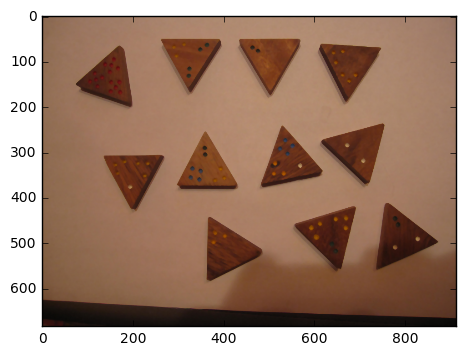

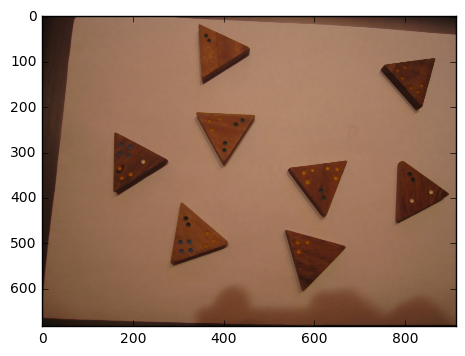

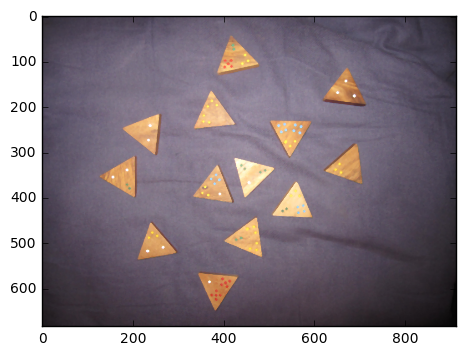

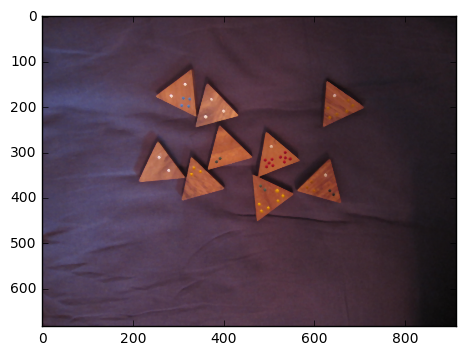

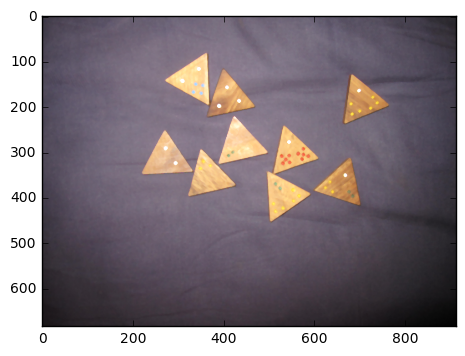

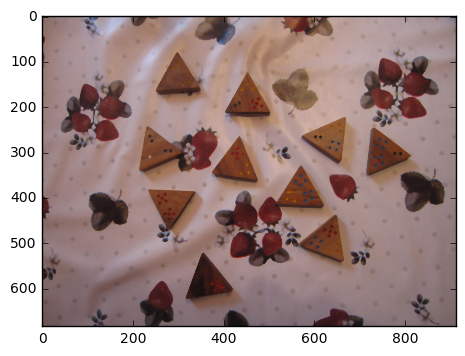

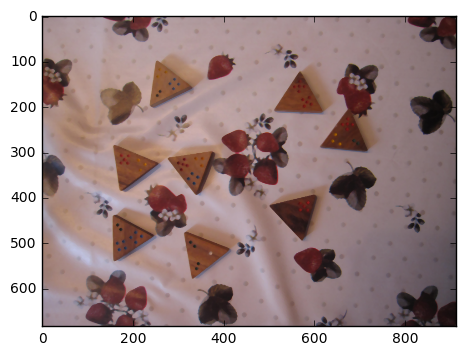

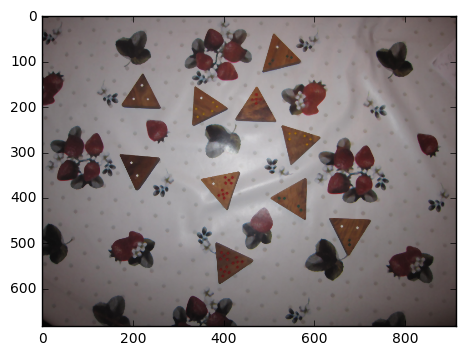

In [2]:
#image
img = [None] * 9
smooth_img = [None] * 9
for i in range(9):
    img[i] = cv2.imread('./pictures/Pict' + str(i) + '.bmp')
    smooth_img[i] = cv2.medianBlur(img[i], ksize = 5)
    plt.imshow(cv2.cvtColor(smooth_img[i], cv2.COLOR_BGR2RGB))
    plt.show()

In [3]:
#th_img = [None] * 9
#for i in range(9):
#    gray = cv2.cvtColor(smooth_img[i],cv2.COLOR_BGR2GRAY)
#    th_img[i] = th3 = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11,-1)
#    th_img[i] = cv2.medianBlur(th_img[i], 3)
#    plt.imshow(th_img[i], cmap = 'gray', interpolation = 'bicubic')
#    plt.show()

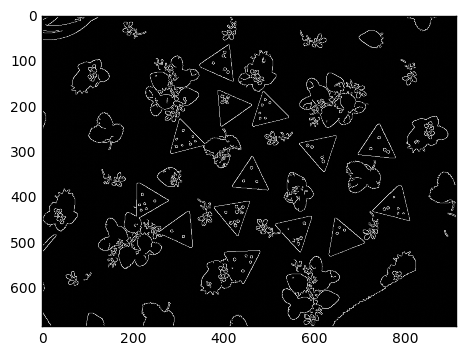

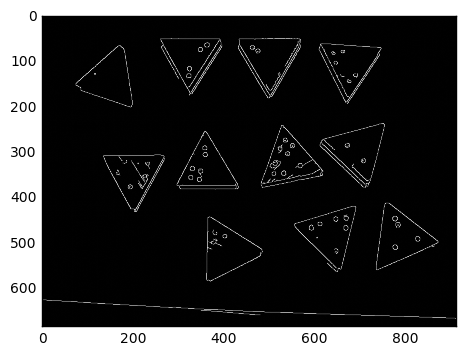

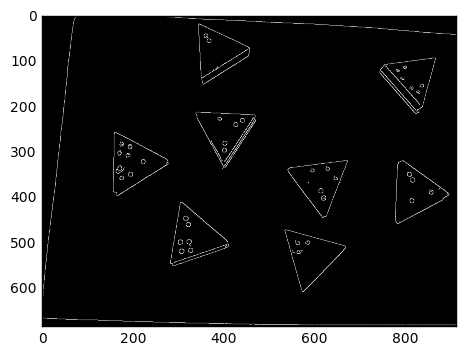

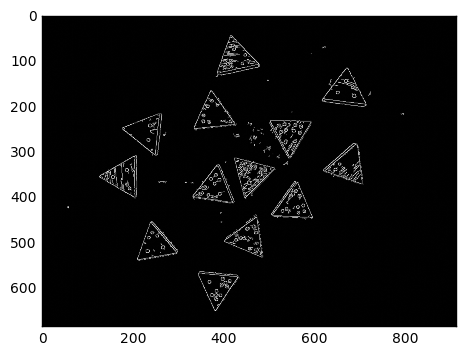

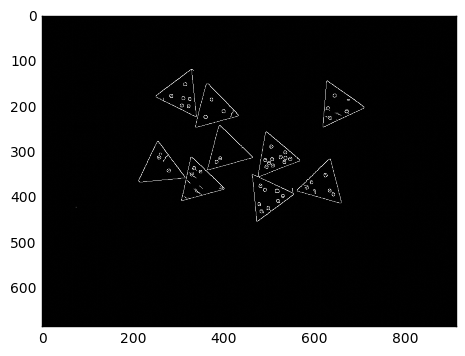

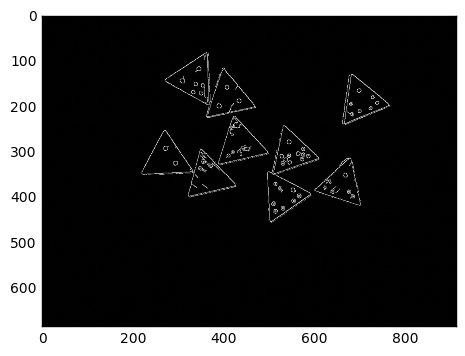

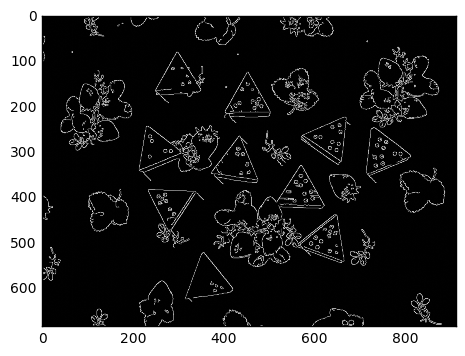

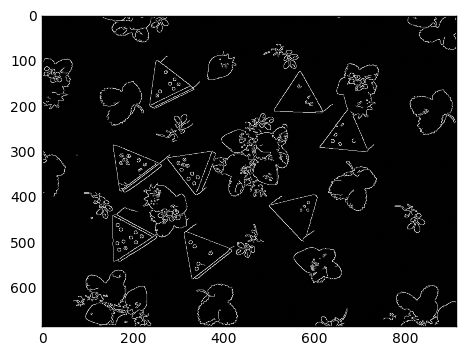

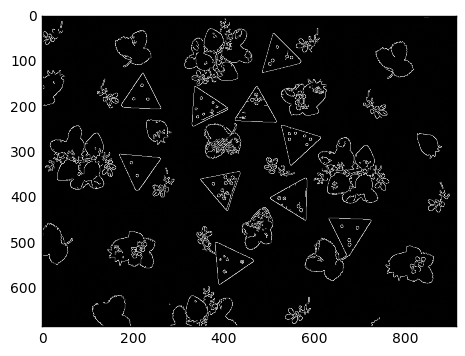

In [4]:
#canny
canny_img = [None] * 9
for i in range(0, 9):
    canny_img[i] = cv2.Canny(img[i], 100, 250) # 100, 250
    plt.imshow(canny_img[i], cmap = 'gray', interpolation = 'bicubic')
    plt.show()

In [5]:
def dist(a):
    return a[0][0] ** 2 + a[0][1] ** 2

def dist(point1, point2):
    return math.sqrt((point1[0] -  point2[0]) ** 2 + (point1[1] -  point2[1]) ** 2);

def almost_eq(a, b, EPS):
    return abs(a - b) / (abs(a) + abs(b)) < EPS

def in_range(l, s, r):
    return l <= s and s <= r

In [6]:
def get_cos(first_segment, second_segment):
    return np.sum(first_segment * second_segment) / np.linalg.norm(first_segment) / np.linalg.norm(second_segment)


def is_colinear(a, b):
    first_segment = a[0:2] - a[2:4]
    second_segment = b[0:2] - b[2:4]
    
    cos = get_cos(first_segment, second_segment)
    
    #print("is_colinear:", first_segment, second_segment)
    #print("cos:", cos)
    #print("result:", almost_eq(abs(cos), 1, 0.2))
    
    return almost_eq(abs(cos), 1., 0.01)


def get_unique_line(buf):
    ans = []
    for i in range(buf.shape[0]):
        ok = 1
        for j in range(0, i):
            if is_colinear(buf[i], buf[j]):
                ok = 0
        if (ok):
            ans.append(buf[i])
    return ans

def line_intersect(l1, l2):
    xa = l1[0]; ya = l1[1]; xb = l1[2]; yb = l1[3];  
    xc = l2[0]; yc = l2[1]; xd = l2[2]; yd = l2[3];
    
    B1 = xb - xa
    A1 = ya - yb
    C1 = - ya * xb + xa * yb
    B2 = xd - xc
    A2 = yc - yd
    C2 = - yc * xd + xc * yd
    
    x = - (C1 * B2 - C2 * B1) / (A1 * B2 - A2 * B1)
    y = - (A1 * C2 - A2 * C1) / (A1 * B2 - A2 * B1)
    
    
    return (int(x + 0.5), int(y + 0.5))

def get_one_triangle(buf):
    ok = 1
    for i in range(len(buf)):
        for j in range(0, i):
            first_segment = buf[i][0:2] - buf[i][2:4]
            second_segment = buf[j][0:2] - buf[j][2:4]
            cos = get_cos(first_segment, second_segment)
            #print(abs(cos), math.cos(math.pi / 3))
            if (not in_range(abs(math.cos(math.pi / 180. * 75.)), abs(cos), abs(math.cos(math.pi / 180. * 45.)))):
                ok = 0
        
    if (len(buf) != 3 or not ok):
        return (False, None, None, None)

    if (len(buf) == 3):
        a = line_intersect(buf[0], buf[1])
        b = line_intersect(buf[1], buf[2])
        c = line_intersect(buf[0], buf[2])
        return (True, a, b, c)

    print("STRANGE")
    return (False, None, None, None)

    
def get_triangles(buf):
    #print("buf:", buf)
    buf = get_unique_line(buf)
    #print("unique_list:", buf)
    ans = []
    if (len(buf) > 3):
        #print("len(buf) > 3:", True)
        for i in range(len(buf)):
            for j in range(0, i):
                for k in range(0, j):
                    (ok, a, b, c) = get_one_triangle((buf[i], buf[j], buf[k]))
                    if (ok):
                        ans.append((a, b, c))
        return ans;
    else:
        ans = []
        ok = 1
        for i in range(len(buf)):
            for j in range(0, i):
                first_segment = buf[i][0:2] - buf[i][2:4]
                second_segment = buf[j][0:2] - buf[j][2:4]
                cos = get_cos(first_segment, second_segment)
                #print(abs(cos), math.cos(math.pi / 3))
                if (not in_range(abs(math.cos(math.pi / 180 * 75)), abs(cos), abs(math.cos(math.pi / 180 * 45)))):
                    ok = 0
        if (len(buf) == 1 or not ok):
            return ans;

        if (len(buf) == 2):
            first_segment = buf[0][0:2] - buf[0][2:4]
            second_segment = buf[1][0:2] - buf[1][2:4]
            cos = get_cos(first_segment, second_segment)
            if (not in_range(abs(math.cos(math.pi / 180. * 75.)), abs(cos), abs(math.cos(math.pi / 180. * 45.)))):
                return []
                    
            a = line_intersect(buf[0], buf[1])
            di = 0
            di = max(di, dist(a, (buf[0][0], buf[0][1])))
            di = max(di, dist(a, (buf[0][2], buf[0][3])))
            di = max(di, dist(a, (buf[1][0], buf[1][1])))
            di = max(di, dist(a, (buf[1][2], buf[1][3])))
            #print("a, di: ", a, di)
            #print("buf:", buf)
            
            d1 = (buf[0][2] - a[0], buf[0][3] - a[1])
            d2 = (buf[1][2] - a[0], buf[1][3] - a[1])
            if (dist(d1, (0, 0)) < 0.0001):
                d1 = (buf[0][0] - a[0], buf[0][1] - a[1])
            if (dist(d2, (0, 0)) < 0.0001):
                d2 = (buf[1][0] - a[0], buf[1][1] - a[1])
            
            d1 = (d1[0] / dist(d1, (0, 0)), d1[1] / dist(d1, (0, 0)))
            d2 = (d2[0] / dist(d2, (0, 0)), d2[1] / dist(d2, (0, 0)))
            #print("d1, d2:", d1, d2)
            b = (int(a[0] + d1[0] * di + 0.5), int(a[1] + d1[1] * di + 0.5))
            c = (int(a[0] + d2[0] * di + 0.5), int(a[1] + d2[1] * di + 0.5))
            #print("b, c:", b, c)
            if (almost_eq(dist(a, b), dist(a, c), 0.1) and
               almost_eq(dist(a, b), dist(b, c), 0.1) and
               almost_eq(dist(b, c), dist(a, c), 0.1)):
                ans.append((a, b, c))
            return ans

        if (len(buf) == 3):
            a = line_intersect(buf[0], buf[1])
            b = line_intersect(buf[1], buf[2])
            c = line_intersect(buf[0], buf[2])
            ans.append((a, b, c))
            return ans

        print("STRANGE")
        return ans

def is_triangle(contour, ind):
    points = copy.deepcopy(contour)
    mi = [[1000, 1000]]
    ma = [[-1000, -1000]]
    for i in points:
        mi[0][0] = min(mi[0][0], i[0, 0])
        ma[0][0] = max(ma[0][0], i[0, 0])
        mi[0][1] = min(mi[0][1], i[0, 1])
        ma[0][1] = max(ma[0][1], i[0, 1])
    for i in range(points.shape[0]):
        points[i, 0, 0] -= mi[0][0]
        points[i, 0, 1] -= mi[0][1]
            
    buf_img = np.zeros((ma[0][1] - mi[0][1] + 1, ma[0][0] - mi[0][0] + 1), dtype=np.uint8)

    
    #for i in range(points.shape[0]):
    #    buf_img[points[i, 0, 0], points[i, 0, 1]] = 255
    cv2.drawContours(buf_img, [points], 0, (255))
    
    lines = cv2.HoughLinesP(image = buf_img, rho = 0.5, theta = math.pi / 180 * 2, threshold = 5,  minLineLength = max((ma[0][0] - mi[0][0] + 1) / 2, 50), maxLineGap = 30)
    if (lines is None):
        return []
    #return True

    buf = lines[:, 0]
    
    all = get_triangles(buf)
    
    line_img = copy.deepcopy(buf_img)
    line_img = np.zeros((buf_img.shape), dtype=np.uint8)
    
    #cv2.line(line_img, a, b, 255)
    #cv2.line(line_img, b, c, 255)
    #cv2.line(line_img, b, a, 255)
        
   
    for i in range(len(buf)):
        cv2.line(line_img, (buf[i][0], buf[i][1]), (buf[i][2], buf[i][3]), 255)
        
    #if (len(all) == 0):
    #    print("IND:", ind)
    #    plt.imshow(line_img, cmap = 'gray', interpolation = 'bicubic')
    #    plt.show()
    
    new_all = []
    for i in range(len(all)):
        new_all.append(((all[i][0][0] + mi[0][0], all[i][0][1] + mi[0][1]),
                       (all[i][1][0] + mi[0][0], all[i][1][1] + mi[0][1]),
                        (all[i][2][0] + mi[0][0], all[i][2][1] + mi[0][1])
                       ))
    #print(ok, a, b, c)
    return new_all;

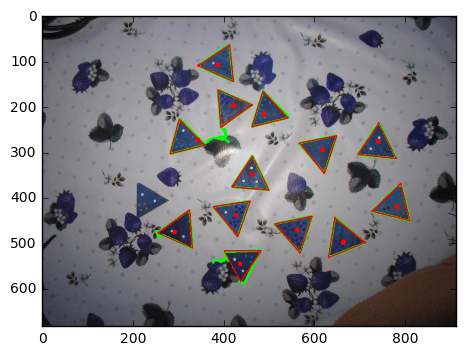

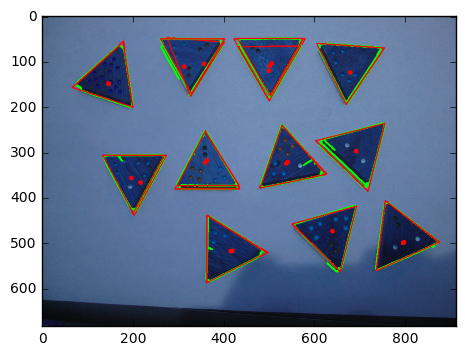

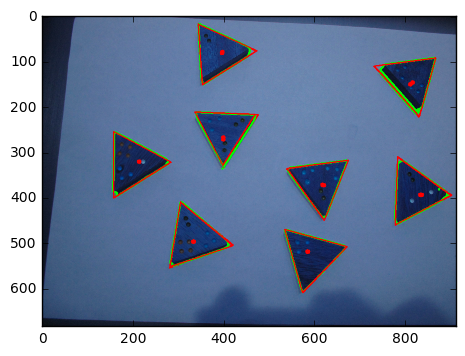

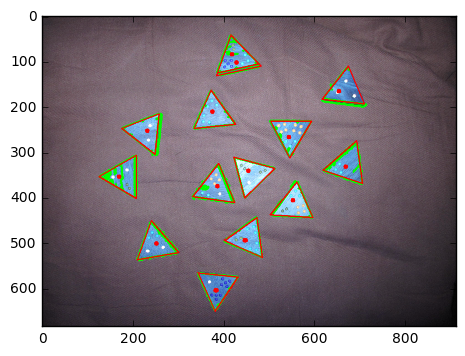

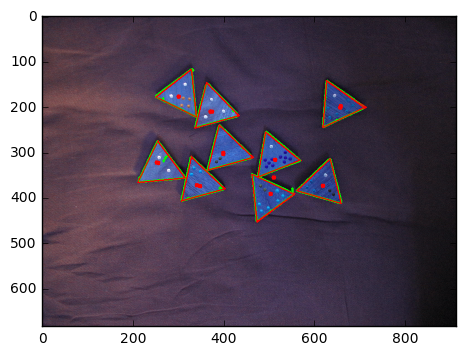

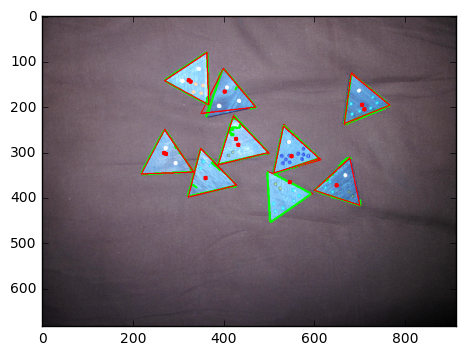

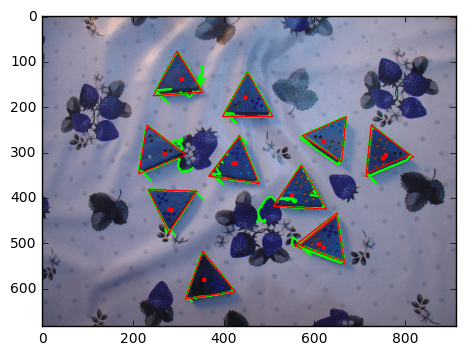

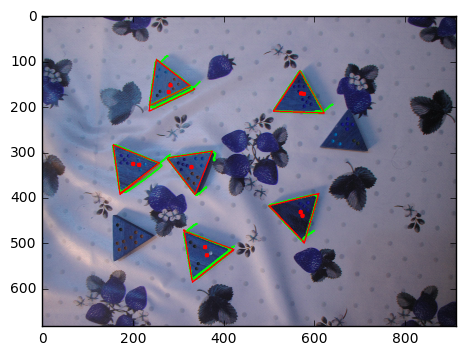

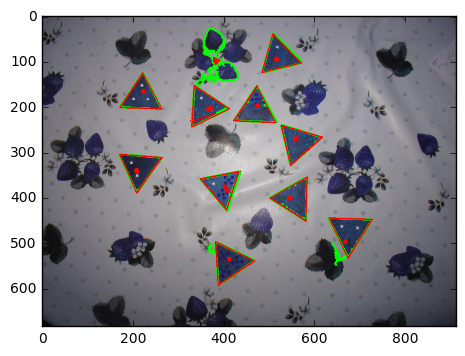

In [7]:
all_triangle = []

for i in range(0, 9):
    all_triangle.append([])
    img1, contours, hierarchy = cv2.findContours(canny_img[i], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    #print(contours[j]);
    new_img = copy.deepcopy(img[i])
    for k in range(len(contours)):
        all = is_triangle(contours[k], k)
        
        for one_triangle in all:
            all_triangle[i].append(one_triangle)
            
        for it in range(len(all)):
            (a, b, c) = all[it]
            centr = np.sum(contours[k], axis = 0) / contours[k].shape[0]
            cv2.drawContours(new_img, contours, k, (0,255,0), 3)
            cv2.circle(new_img, (int(centr[0][0]), int(centr[0][1])), 5, (255, 0, 0), -5)
            cv2.line(new_img, a, b, 255, 2)
            cv2.line(new_img, b, c, 255, 2)
            cv2.line(new_img, c, a, 255, 2)

    plt.imshow(new_img, cmap = 'gray', interpolation = 'bicubic')
    plt.show()
    
    

In [8]:
for i in range(9):
    print(len(all_triangle[i]))

21
20
15
16
16
14
14
11
19


In [9]:
BORDER_S = 200
BORDER_DIST = 100

def get_area(triangle):
    a = triangle[0]
    b = triangle[1]
    c = triangle[2]
    
    df = (b[0] - a[0], b[1] - a[1])
    dg = (c[0] - a[0], c[1] - a[1])
    
    return abs(df[0] * dg[1] - df[1] * dg[0])

perm = [[0, 1, 2], [0, 2, 1], [1, 0, 2], [1, 2, 0], [2, 0, 1], [2, 1, 0]]

def is_near_triangles1(trinagle_a, triangle_b):
    cur_dist = 0
    for i in range(3):
        cur_dist += dist(trinagle_a[i], triangle_b[i])

    return (cur_dist < BORDER_DIST)

    
def is_near_triangles(triangle_a, triangle_b):
    for i in range(len(perm)):
        new_triangle = [
                        triangle_a[perm[i][0]],
                        triangle_a[perm[i][1]],
                        triangle_a[perm[i][2]]
                       ]
        if (is_near_triangles1(new_triangle, triangle_b)):
            return 1
    return 0

def get_good_triangles(triangles):
    good_triangles = []
    for i in range(len(triangles)):
        one_triangle = triangles[i]
        if (get_area(one_triangle) < BORDER_S):
            continue
        ok = 1
        for j in range(i):
            if is_near_triangles(triangles[i], triangles[j]):
                ok = 0
                break
                
        if (ok):
            good_triangles.append(one_triangle)
            
    return good_triangles;

In [10]:
good_triangles = []
for i in range(9):
    good_triangles.append(get_good_triangles(all_triangle[i]))
    print(len(good_triangles[i]))

13
11
8
13
9
9
10
6
10


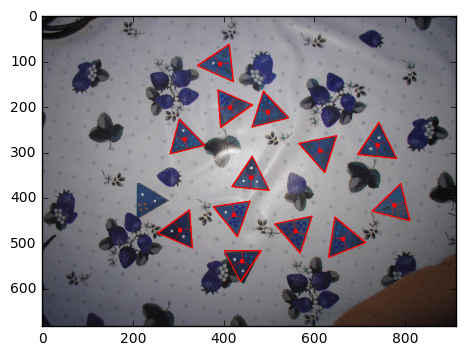

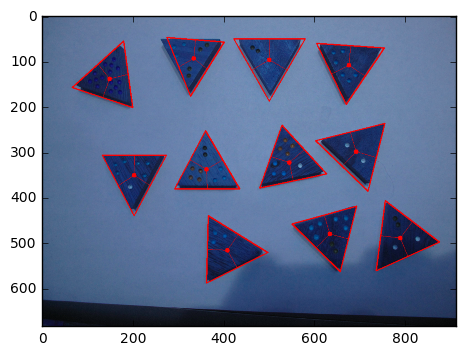

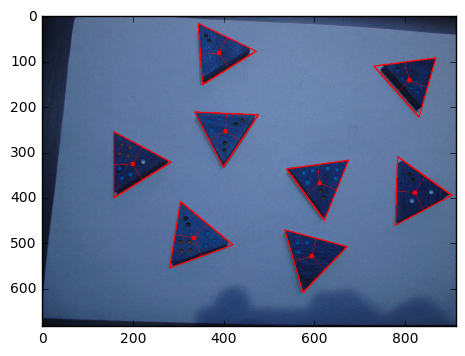

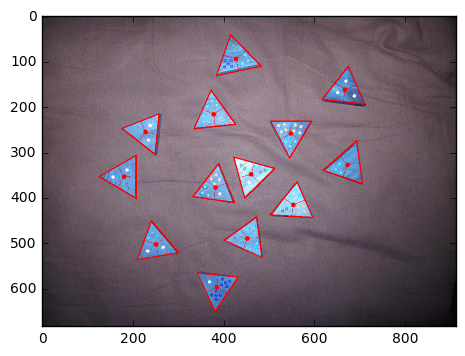

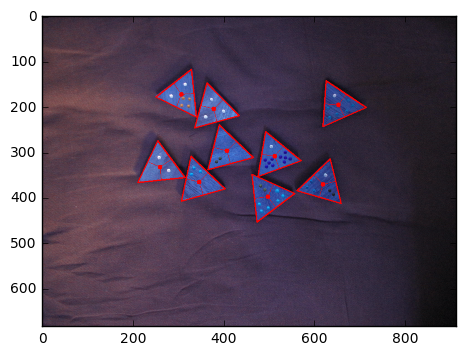

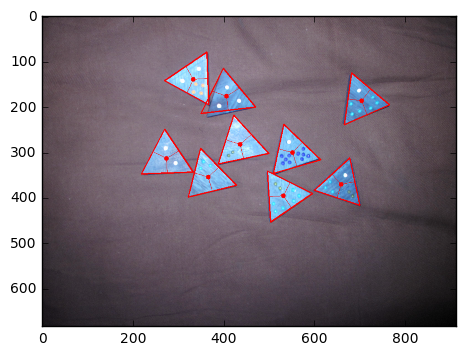

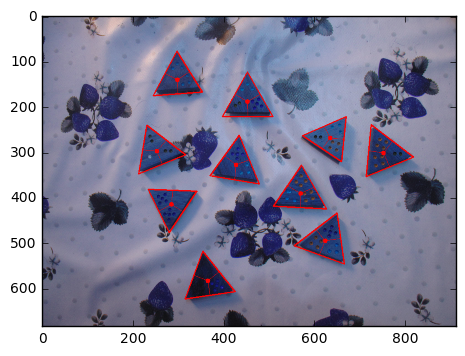

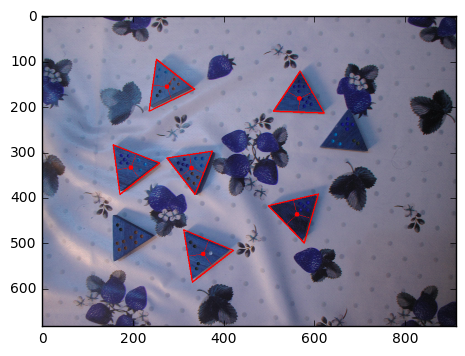

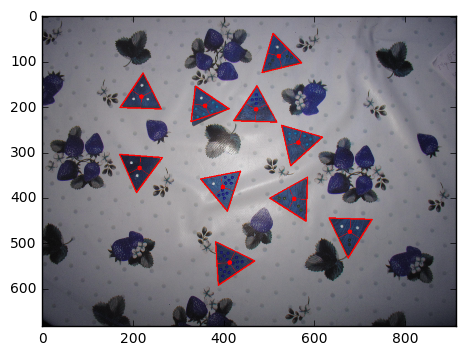

In [11]:
for i in range(0, 9):
    new_img = copy.deepcopy(img[i])
    for it in range(len(good_triangles[i])):
        (a, b, c) = good_triangles[i][it]
        centr = (int((a[0] + b[0] + c[0]) / 3. + 0.5), int((a[1] + b[1] + c[1]) / 3. + 0.5))
        #cv2.drawContours(new_img, contours, k, (0,255,0), 3)
        
        cv2.line(new_img, a, b, 255, 2)
        cv2.line(new_img, b, c, 255, 2)
        cv2.line(new_img, c, a, 255, 2)
        cv2.circle(new_img, (centr[0], centr[1]), 5, (255, 0, 0), -5)
        
        med_ab = (int((a[0] + b[0]) / 2. + 0.5), int((a[1] + b[1]) / 2. + 0.5))
        med_bc = (int((b[0] + c[0]) / 2. + 0.5), int((b[1] + c[1]) / 2. + 0.5))
        med_ac = (int((a[0] + c[0]) / 2. + 0.5), int((a[1] + c[1]) / 2. + 0.5))
        
        cv2.line(new_img, centr, med_ab, 255, 1)
        cv2.line(new_img, centr, med_bc, 255, 1)
        cv2.line(new_img, centr, med_ac, 255, 1)
        
        
    plt.imshow(new_img, cmap = 'gray', interpolation = 'bicubic')
    plt.show()

In [14]:
def get_fragment(img, a, b, c):
    mi_x = min(a[0], b[0], c[0])
    mi_y = min(a[1], b[1], c[1])
    ma_x = max(a[0], b[0], c[0])
    ma_y = max(a[1], b[1], c[1])
    
    #print(mi_x, ma_x, mi_y, ma_y)
    frag = copy.deepcopy(img[mi_y:ma_y, mi_x:ma_x])
    return (frag, mi_x, mi_y)

def almost_equal_pixel(a, b, BORDER):
    #print(a, b)
    #print(((a[0] - b[0]) ** 2 + (a[1] - b[1]) ** 2 + (a[2] - b[2]) ** 2))
    return (((int(a[0]) - b[0]) ** 2 + (int(a[1]) - b[1]) ** 2 + (int(a[2]) - b[2]) ** 2) < BORDER)


dxy = [[0, 1], [0, -1], [1, 0], [-1, 0]]
def bfs(img, p, color, BORDER):
    cnt = 0
    
    was = np.zeros(img.shape[0:2])
    l = 0
    que = [p]
    while (l < len(que)):
        p = que[l]
        l += 1
        if (
            np.array_equal(img[p[0], p[1]], np.array([255, 0, 0])) or
            was[p[0], p[1]]
           ):
            continue

        was[p[0], p[1]] = 1
        cnt += 1
        for i in range(len(dxy)):
            q = (p[0] + dxy[i][0], p[1] + dxy[i][1])
            if (not in_range(0, q[0], img.shape[0] - 1) or 
                not in_range(0, q[1], img.shape[1] - 1)):
                continue
                
            if (almost_equal_pixel(img[p[0], p[1]], img[q[0], q[1]], BORDER)):
                que.append(q)
        img[p[0], p[1]] = color
    return img, was, cnt
    
def process_one_fragment(img, a, b, c, d, BORDER):
    centr = (int((a[0] + b[0] + c[0] + d[0]) / 4. + 0.5), int((a[1] + b[1] + c[1] + d[1]) / 4. + 0.5))

    #cv2.circle(img, (centr[0], centr[1]), 2, (255, 255, 0), -5)
    
    return bfs(img, (centr[1], centr[0]), np.array([255, 255, 255]), BORDER)

def simple_bfs(img, was, p):
    cnt = 0
    l = 0
    que = [p]
    while (l < len(que)):
        p = que[l]
        l += 1
        if (
            np.array_equal(img[p[0], p[1]], np.array([255, 0, 0])) or
            was[p[0], p[1]]
           ):
            continue

        was[p[0], p[1]] = 1
        cnt += 1
        for i in range(len(dxy)):
            q = (p[0] + dxy[i][0], p[1] + dxy[i][1])
            if (not in_range(0, q[0], img.shape[0] - 1) or 
                not in_range(0, q[1], img.shape[1] - 1)):
                continue

            if (img[p[0], p[1]] == img[q[0], q[1]]):
                que.append(q)
                
    return cnt

BORDER_L = 26
BORDER_R = 300

def get_cnt_area(img):
    ans = 0;
    was = np.zeros(img.shape[0:2])
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if (not was[i, j]):
                
                cnt = simple_bfs(img, was, (i, j))
                if (in_range(BORDER_L, cnt, BORDER_R) and img[i, j] == 0):
                    ans += 1
                    print("cnt:", cnt)
    return ans

def get_cnt_for_one_fragment(one_frag, was, cnt, img):
    one_frag_array = np.zeros((cnt, 5))
    
    it = 0
    for i in range(was.shape[0]):
        for j in range(was.shape[1]):
            if (was[i, j]):
                one_frag_array[it][0:5] = np.array([i, j, img[i, j, 0], img[i, j, 1], img[i, j, 2]])
                buf = np.isnan(one_frag_array)
                it += 1
                    
    ans = IsolationForest().fit(one_frag_array).decision_function(one_frag_array)
    ans[np.isnan(ans)] = 0
    mi = np.min(ans)
    ma = np.max(ans)
    new_img = np.zeros(img.shape[0:3], dtype = np.uint8)
    if (ma != mi):
        ans = (ans - mi) / (ma - mi) * 255
    else:
        ans = ans * 0
        
    for i in range(one_frag_array.shape[0]):
        one = one_frag_array[i]
        new_img[one[0], one[1]] = [ans[i], ans[i], ans[i]]

    new_img = cv2.medianBlur(new_img, ksize = 3) # 3
    
    #plt.imshow(new_img, cmap = 'gray', interpolation = 'bicubic')
    #plt.show()
    #plt.imshow(cv2.Canny(new_img, 200, 250), cmap = 'gray', interpolation = 'bicubic')
    #plt.show()
    binary_img = cv2.adaptiveThreshold(new_img[:,:,0],255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 25,-1)
    #plt.imshow(binary_img, cmap = 'gray', interpolation = 'bicubic')
    #plt.show()
    return get_cnt_area(binary_img)
    
def process_one_triangle(img, a, b, c, mi_x, mi_y):
    img = cv2.GaussianBlur(img, (3, 3), 0); # 3
    
    a = (a[0] - mi_x, a[1] - mi_y)
    b = (b[0] - mi_x, b[1] - mi_y)
    c = (c[0] - mi_x, c[1] - mi_y)
    centr = (int((a[0] + b[0] + c[0]) / 3. + 0.5), int((a[1] + b[1] + c[1]) / 3. + 0.5))
    med_ab = (int((a[0] + b[0]) / 2. + 0.5), int((a[1] + b[1]) / 2. + 0.5))
    med_bc = (int((b[0] + c[0]) / 2. + 0.5), int((b[1] + c[1]) / 2. + 0.5))
    med_ac = (int((a[0] + c[0]) / 2. + 0.5), int((a[1] + c[1]) / 2. + 0.5))
    
    cv2.line(img, centr, med_ab, 255, 1)
    cv2.line(img, centr, med_bc, 255, 1)
    cv2.line(img, centr, med_ac, 255, 1)
    
        
    cv2.line(img, a, b, 255, 1)
    cv2.line(img, b, c, 255, 1)
    cv2.line(img, c, a, 255, 1)
    
    cv2.circle(img, (centr[0], centr[1]), 2, (255, 0, 0), -5)
    first_frag, was, cnt = process_one_fragment(copy.deepcopy(img), a, med_ab, centr, med_ac, 10000000)
    a = get_cnt_for_one_fragment(first_frag, was, cnt, copy.deepcopy(img))

    second_frag, was, cnt = process_one_fragment(copy.deepcopy(img), b, med_ab, centr, med_bc, 1000000)
    b = get_cnt_for_one_fragment(second_frag, was, cnt, copy.deepcopy(img))
    
    third_frag, was, cnt = process_one_fragment(copy.deepcopy(img), c, med_bc, centr, med_ac, 10000000)
    c = get_cnt_for_one_fragment(second_frag, was, cnt, copy.deepcopy(img))
    
    #plt.imshow(second_frag, cmap = 'gray', interpolation = 'bicubic')
    #plt.show()
    #plt.imshow(third_frag, cmap = 'gray', interpolation = 'bicubic')
    #plt.show()


    #plt.imshow(cv2.Canny(img, 50, 150), cmap = 'gray', interpolation = 'bicubic')
    #plt.show()
    plt.imshow(img, cmap = 'gray', interpolation = 'bicubic')
    plt.show()
    return (a, b, c)

/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 67


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 27
cnt: 31
cnt: 30
cnt: 36


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 26
cnt: 31
cnt: 35
cnt: 31
cnt: 27


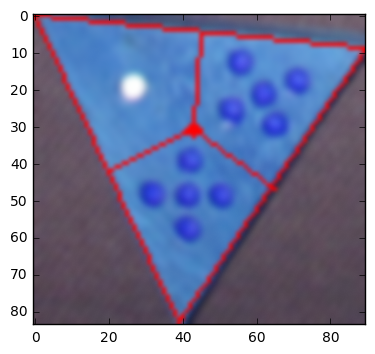

1 4 5


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 44
cnt: 31
cnt: 33


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 74


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 63


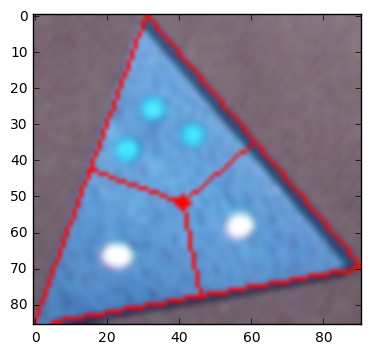

3 1 1


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 50
cnt: 50
cnt: 34


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 33
cnt: 27
cnt: 29


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 56
cnt: 46


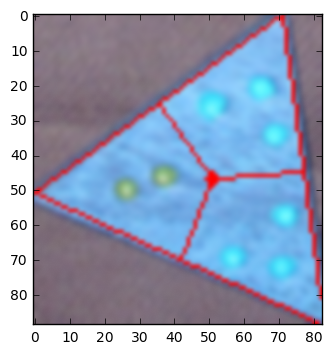

3 3 2


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 54
cnt: 51


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 27
cnt: 39
cnt: 38


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


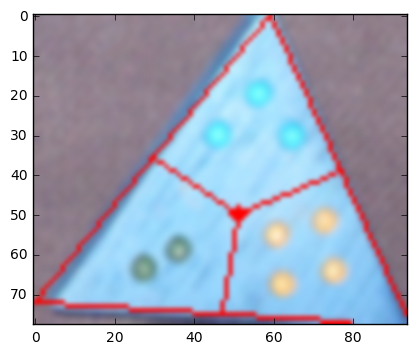

2 3 0


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 51


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 91
cnt: 39
cnt: 43


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 40
cnt: 30
cnt: 44
cnt: 27


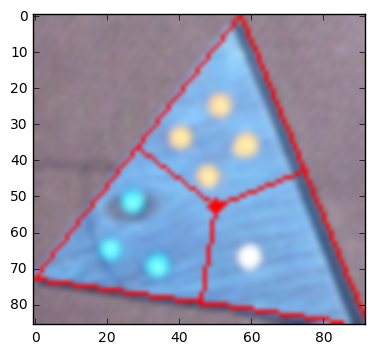

1 3 4


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 45
cnt: 56


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 46
cnt: 65


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 69


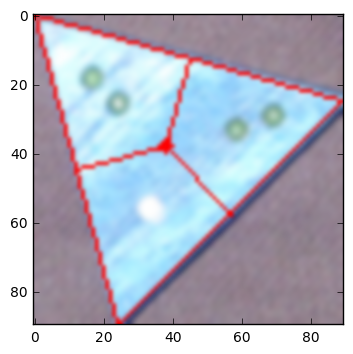

2 2 1


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 43
cnt: 52


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 69


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 69


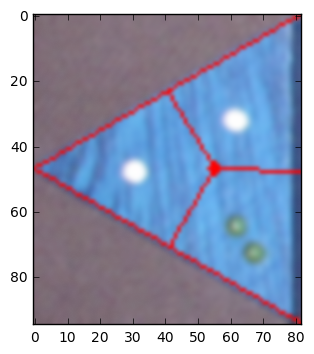

2 1 1


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 44
cnt: 46
cnt: 32


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


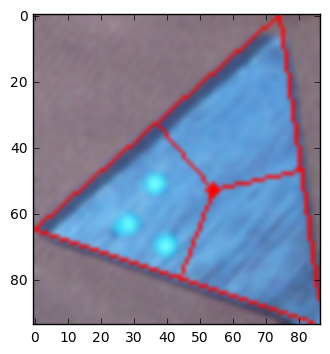

3 0 0


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 80
cnt: 38


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 44
cnt: 54
cnt: 43
cnt: 44


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 43
cnt: 45
cnt: 54
cnt: 49


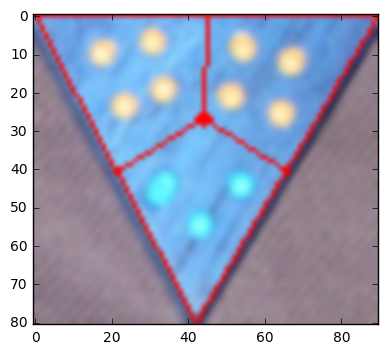

2 4 4


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 58


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 81


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


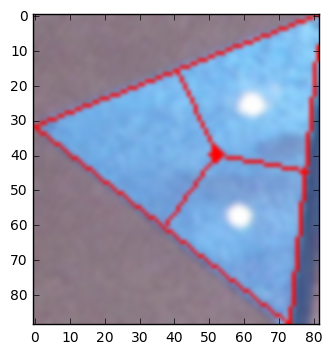

1 1 0


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 72


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 39
cnt: 40
cnt: 48


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 34
cnt: 44
cnt: 55


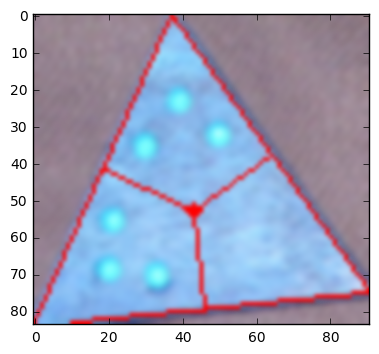

1 3 3


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 64


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 87


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 64


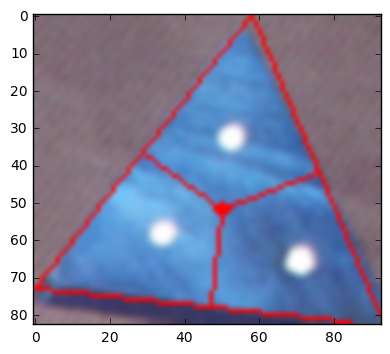

1 1 1


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 44
cnt: 38


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 42
cnt: 81


/Users/skrrydg/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:118: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


cnt: 30
cnt: 44


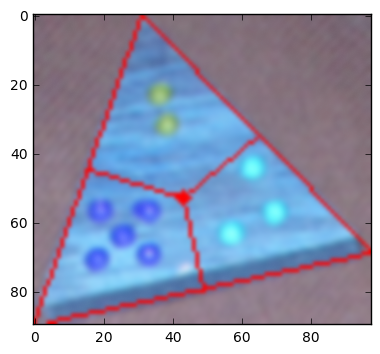

2 2 2


In [18]:
for i in range(3, 4):
    for it in range(0, len(good_triangles[i])):
        (a, b, c) = good_triangles[i][it]
        
        (frag, mi_x, mi_y) = get_fragment(img[i], a, b, c)

        (a, b, c) = process_one_triangle(frag, a, b, c, mi_x, mi_y)
        print(a, b, c)
        